In [42]:
import shutil
from sentinelsat import SentinelAPI, read_geojson, geojson_to_wkt
from datetime import date
import pandas as pd
import os
import rasterio
import cv2
import matplotlib.pyplot as plt
import itertools
import re
from rasterio.plot import show
from rasterio.warp import reproject, Resampling
import numpy as np

In [43]:
def get_band(image_folder, band, resolution=10):
    subfolder = [f for f in os.listdir(image_folder + "/GRANULE") if f[0] == "L"][0]
    image_folder_path = f"{image_folder}/GRANULE/{subfolder}/IMG_DATA/R{resolution}m"
    image_files = [im for im in os.listdir(image_folder_path) if im[-4:] == ".jp2"]
    selected_file = [im for im in image_files if im.split("_")[2] == band][0]

    with rasterio.open(f"{image_folder_path}/{selected_file}") as infile:
        img = infile.read(1)

    return img

In [44]:
# To be replaced depending on which image is processed
image_folder = 'backup/sentinel-2 data/S2A_MSIL2A_20230717T092031_N0509_R093_T35TLN_20230717T125201.SAFE'
# image_folder = 'backup/sentinel-2 data/S2B_MSIL2A_20230712T091559_N0509_R093_T35TLL_20230712T105354.SAFE'
# image_folder = 'backup/sentinel-2 data/S2B_MSIL2A_20230715T092559_N0509_R136_T34TFS_20230715T110017.SAFE'

folder_name = os.path.basename(image_folder).rsplit('.', 1)[0]

print(folder_name)  # Outputs: S2A_MSIL2A_20230717T092031_N0509_R093_T35TLN_20230717T125201
band_dict = {}

S2A_MSIL2A_20230717T092031_N0509_R093_T35TLN_20230717T125201


In [45]:
for band in ["B02", "B03", "B04", "B08"]:
    band_dict[band] = get_band(image_folder, band, 10)

img = cv2.merge((band_dict["B04"], band_dict["B03"], band_dict["B02"]))
img_processed = img / 22
img_processed = img_processed.astype("uint8")

In [46]:
output_tif = 'misc/processed_image.tif'
with rasterio.open(
    output_tif,
    'w',
    driver='GTiff',
    height=img_processed.shape[0],
    width=img_processed.shape[1],
    count=3,
    dtype=img_processed.dtype,
    crs='EPSG:4326',  # Update with the correct CRS if known
    transform=rasterio.transform.from_origin(0, 0, 10, 10)  # Update with correct geotransform if known
) as dst:
    dst.write(img_processed[:, :, 0], 1)  # Write Red channel
    dst.write(img_processed[:, :, 1], 2)  # Write Green channel
    dst.write(img_processed[:, :, 2], 3)  # Write Blue channel

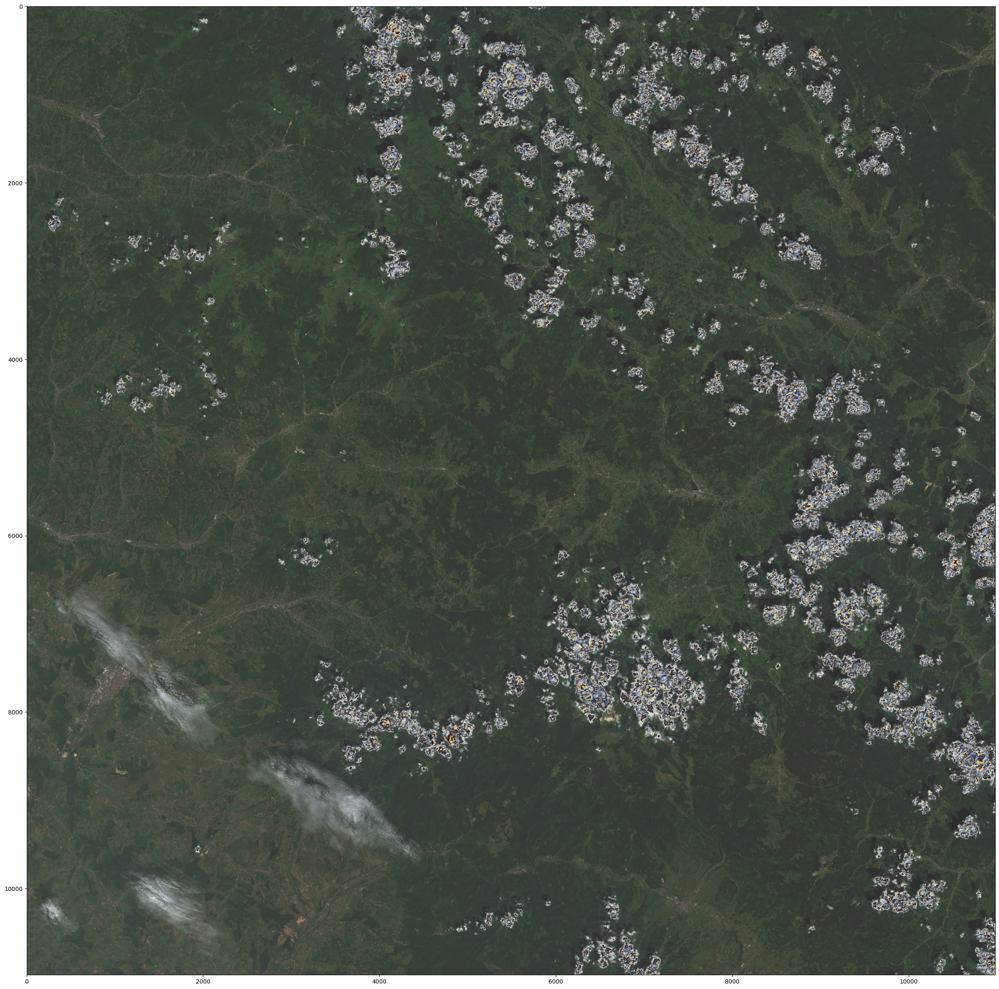

In [47]:
plt.figure(figsize=(30, 30))
plt.imshow(img_processed)

In [48]:
frag_count_row = int(img_processed.shape[0] / 160)
frag_count_col = int(img_processed.shape[1] / 160)
frag_count = min(frag_count_row, frag_count_col)
frag_size = int(img_processed.shape[0] / frag_count)
frag_dict = {}


In [49]:
for y, x in itertools.product(range(frag_count), range(frag_count)):
    frag_dict[(x, y)] = img_processed[y*frag_size: (y+1)*frag_size, x*frag_size: (x+1)*frag_size, :]
    frag_dict[(x, y)] = cv2.resize(frag_dict[(x, y)], (224, 224), interpolation=cv2.INTER_LANCZOS4)
    img_rgb = cv2.cvtColor(frag_dict[(x, y)], cv2.COLOR_BGR2RGB)
    frag_path = f"sentinel-data/fragments/fragment_{folder_name}_{x}_{y}.jpg"
    cv2.imwrite(frag_path, img_rgb)

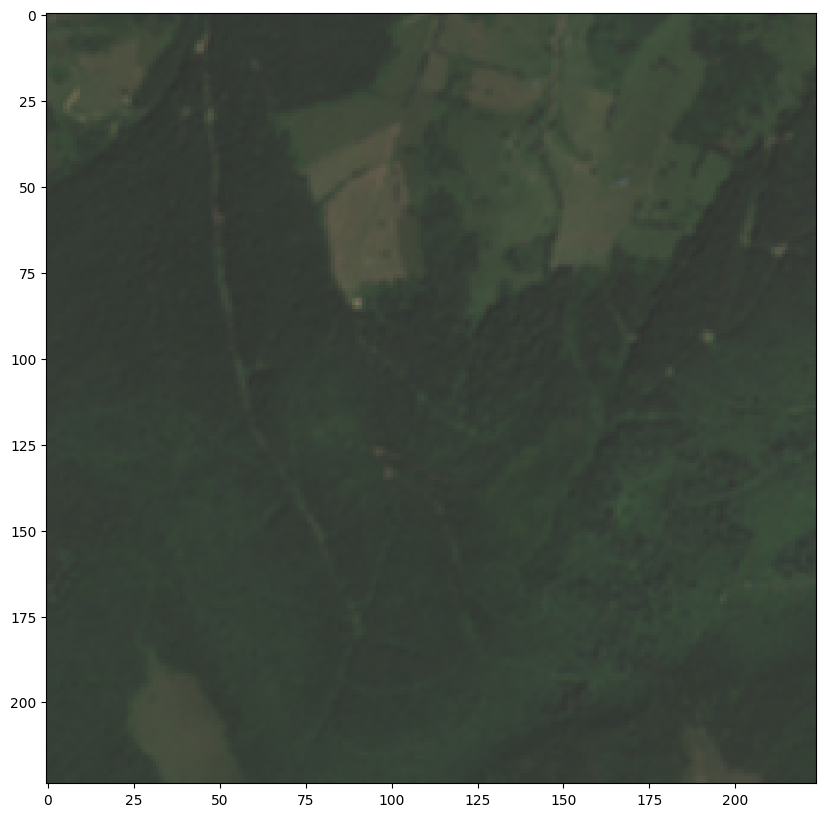

In [50]:
plt.figure(figsize=(10, 10))
plt.imshow(frag_dict[(24, 34)])

Work-In-Progress - Hansen Reprojection

In [ ]:
import rasterio
import numpy as np
from rasterio.warp import reproject, Resampling
import matplotlib.pyplot as plt

In [ ]:
fp = 'misc/Hansen_GFC-2023-v1.11_lossyear_50N_020E.tif'

with rasterio.open(fp) as src:
    hansen_data = src.read(1)
    src_crs = src.crs
    src_transform = src.transform

In [ ]:
sat = 'processed_image.tif'

with rasterio.open(sat) as dst:
    dst_crs = dst.crs
    dst_transform = dst.transform
    width = dst.width
    height = dst.height

In [ ]:
dst_reprojected = np.empty((height, width), dtype=hansen_data.dtype)

In [ ]:
reproject(
    source=hansen_data,
    destination=dst_reprojected,
    src_transform=src_transform,
    src_crs=src_crs,
    dst_transform=dst_transform,
    dst_crs=dst_crs,
    resampling=Resampling.nearest
)

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(dst_reprojected, cmap='gray')
plt.title('Reprojected Hansen Data')
plt.show()